https://huggingface.co/docs/diffusers/en/quicktour

In [1]:

from diffusers import DiffusionPipeline

pipeline = DiffusionPipeline.from_pretrained("runwayml/stable-diffusion-v1-5", use_safetensors=True)

/home/sushanth/.conda/envs/py311diffuser/lib/python3.11/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [2]:
pipeline

StableDiffusionPipeline {
  "_class_name": "StableDiffusionPipeline",
  "_diffusers_version": "0.18.2",
  "feature_extractor": [
    "transformers",
    "CLIPImageProcessor"
  ],
  "requires_safety_checker": true,
  "safety_checker": [
    "stable_diffusion",
    "StableDiffusionSafetyChecker"
  ],
  "scheduler": [
    "diffusers",
    "PNDMScheduler"
  ],
  "text_encoder": [
    "transformers",
    "CLIPTextModel"
  ],
  "tokenizer": [
    "transformers",
    "CLIPTokenizer"
  ],
  "unet": [
    "diffusers",
    "UNet2DConditionModel"
  ],
  "vae": [
    "diffusers",
    "AutoencoderKL"
  ]
}

In [3]:
pipeline.to("cuda")

StableDiffusionPipeline {
  "_class_name": "StableDiffusionPipeline",
  "_diffusers_version": "0.18.2",
  "feature_extractor": [
    "transformers",
    "CLIPImageProcessor"
  ],
  "requires_safety_checker": true,
  "safety_checker": [
    "stable_diffusion",
    "StableDiffusionSafetyChecker"
  ],
  "scheduler": [
    "diffusers",
    "PNDMScheduler"
  ],
  "text_encoder": [
    "transformers",
    "CLIPTextModel"
  ],
  "tokenizer": [
    "transformers",
    "CLIPTokenizer"
  ],
  "unet": [
    "diffusers",
    "UNet2DConditionModel"
  ],
  "vae": [
    "diffusers",
    "AutoencoderKL"
  ]
}

100%|██████████| 50/50 [00:04<00:00, 11.89it/s]


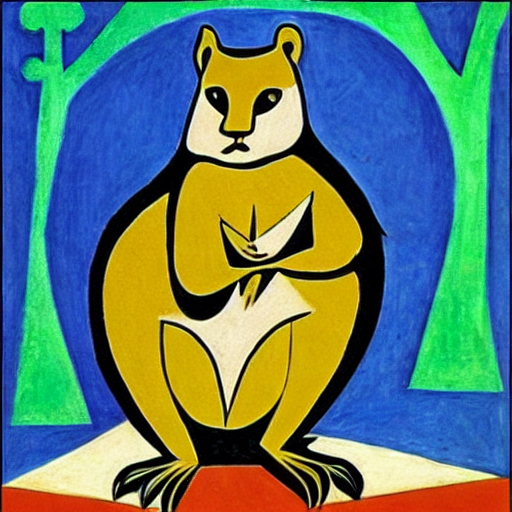

In [4]:
image = pipeline("An image of a squirrel in Picasso style").images[0]
image

In [5]:
image.save("image_of_squirrel_painting.png")

In [6]:
# !git lfs install
# !git clone https://huggingface.co/runwayml/stable-diffusion-v1-5

In [7]:
# pipeline = DiffusionPipeline.from_pretrained("./stable-diffusion-v1-5", use_safetensors=True)

In [8]:
from diffusers import EulerDiscreteScheduler

pipeline = DiffusionPipeline.from_pretrained("runwayml/stable-diffusion-v1-5", use_safetensors=True)
pipeline.scheduler = EulerDiscreteScheduler.from_config(pipeline.scheduler.config)

100%|██████████| 50/50 [01:55<00:00,  2.31s/it]


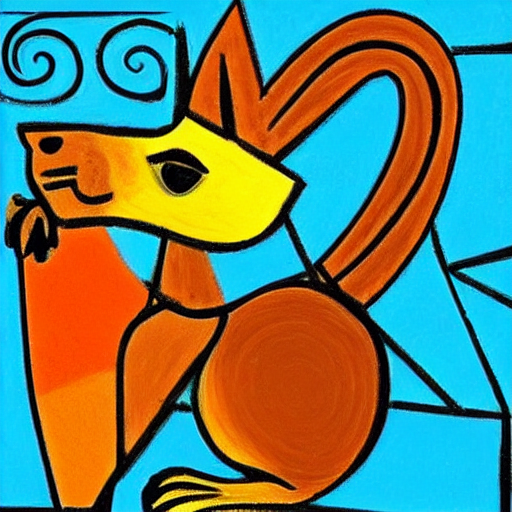

In [9]:
image = pipeline("An image of a squirrel in Picasso style").images[0]
image

100%|██████████| 50/50 [01:57<00:00,  2.35s/it]


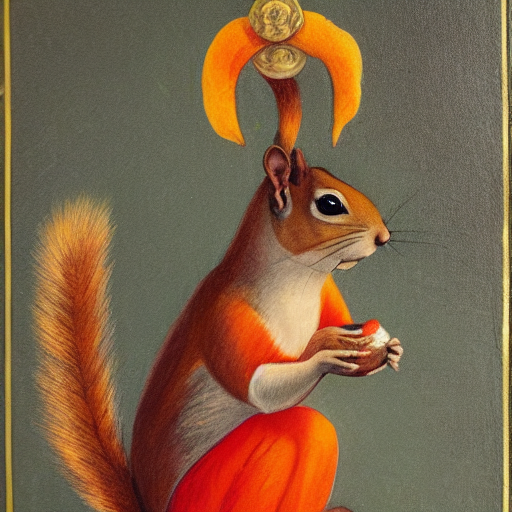

In [15]:
image = pipeline("An image of a squirrel in Raja Ravi Varma style").images[0]
image


100%|██████████| 50/50 [01:57<00:00,  2.35s/it]


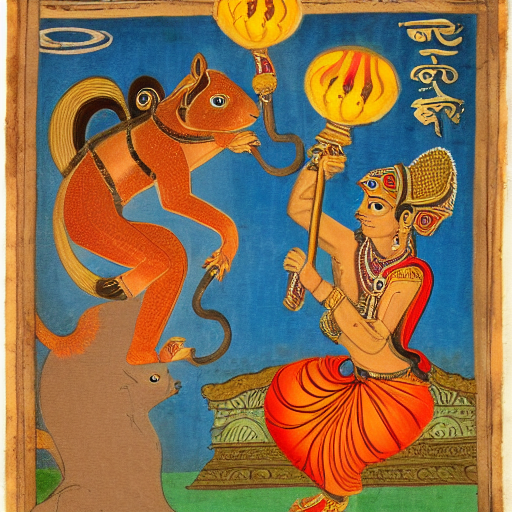

In [16]:
image = pipeline("An image of a squirrel in Ramayana epic style").images[0]
image

In [10]:
from diffusers import UNet2DModel

repo_id = "google/ddpm-cat-256"
model = UNet2DModel.from_pretrained(repo_id, use_safetensors=True)

config.json: 100%|██████████| 790/790 [00:00<00:00, 7.58MB/s]
diffusion_pytorch_model.safetensors: 100%|██████████| 455M/455M [00:04<00:00, 101MB/s]  


In [11]:
model.config

FrozenDict([('sample_size', 256),
            ('in_channels', 3),
            ('out_channels', 3),
            ('center_input_sample', False),
            ('time_embedding_type', 'positional'),
            ('freq_shift', 1),
            ('flip_sin_to_cos', False),
            ('down_block_types',
             ['DownBlock2D',
              'DownBlock2D',
              'DownBlock2D',
              'DownBlock2D',
              'AttnDownBlock2D',
              'DownBlock2D']),
            ('up_block_types',
             ['UpBlock2D',
              'AttnUpBlock2D',
              'UpBlock2D',
              'UpBlock2D',
              'UpBlock2D',
              'UpBlock2D']),
            ('block_out_channels', [128, 128, 256, 256, 512, 512]),
            ('layers_per_block', 2),
            ('mid_block_scale_factor', 1),
            ('downsample_padding', 0),
            ('downsample_type', 'conv'),
            ('upsample_type', 'conv'),
            ('act_fn', 'silu'),
            ('attention_

In [28]:
import torch

torch.manual_seed(103)

noisy_sample = torch.randn(1, model.config.in_channels, model.config.sample_size, model.config.sample_size)
noisy_sample.shape

torch.Size([1, 3, 256, 256])

In [29]:
with torch.no_grad():
    noisy_residual = model(sample=noisy_sample, timestep=2).sample

RuntimeError: Expected all tensors to be on the same device, but found at least two devices, cuda:0 and cpu! (when checking argument for argument mat1 in method wrapper_CUDA_addmm)

In [14]:
from diffusers import DDPMScheduler

scheduler = DDPMScheduler.from_pretrained(repo_id)
scheduler

scheduler_config.json: 100%|██████████| 256/256 [00:00<00:00, 2.77MB/s]


DDPMScheduler {
  "_class_name": "DDPMScheduler",
  "_diffusers_version": "0.18.2",
  "beta_end": 0.02,
  "beta_schedule": "linear",
  "beta_start": 0.0001,
  "clip_sample": true,
  "clip_sample_range": 1.0,
  "dynamic_thresholding_ratio": 0.995,
  "num_train_timesteps": 1000,
  "prediction_type": "epsilon",
  "sample_max_value": 1.0,
  "steps_offset": 0,
  "thresholding": false,
  "timestep_spacing": "leading",
  "trained_betas": null,
  "variance_type": "fixed_small"
}

In [17]:
less_noisy_sample = scheduler.step(model_output=noisy_residual, timestep=2, sample=noisy_sample).prev_sample
less_noisy_sample.shape

torch.Size([1, 3, 256, 256])

In [18]:
import PIL.Image
import numpy as np


def display_sample(sample, i):
    image_processed = sample.cpu().permute(0, 2, 3, 1)
    image_processed = (image_processed + 1.0) * 127.5
    image_processed = image_processed.numpy().astype(np.uint8)

    image_pil = PIL.Image.fromarray(image_processed[0])
    display(f"Image at step {i}")
    display(image_pil)

In [19]:
model.to("cuda")
noisy_sample = noisy_sample.to("cuda")

In [20]:
model.to("cuda")
noisy_sample = noisy_sample.to("cuda")

  5%|▍         | 48/1000 [00:01<00:21, 43.33it/s]

'Image at step 50'

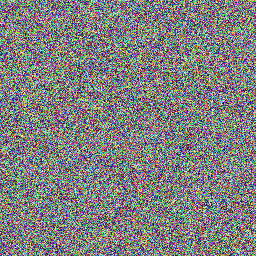

 10%|▉         | 98/1000 [00:02<00:20, 43.85it/s]

'Image at step 100'

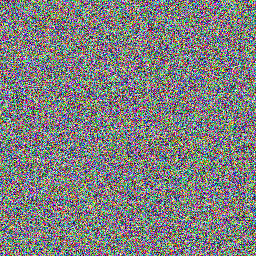

 15%|█▍        | 148/1000 [00:03<00:19, 43.82it/s]

'Image at step 150'

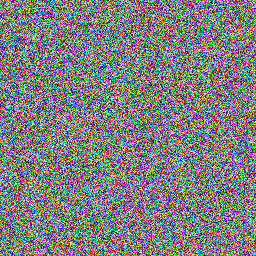

 20%|█▉        | 198/1000 [00:04<00:18, 43.85it/s]

'Image at step 200'

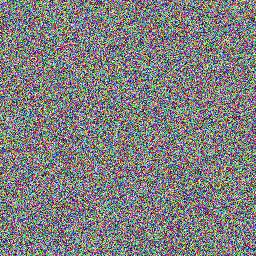

 25%|██▍       | 248/1000 [00:05<00:17, 43.76it/s]

'Image at step 250'

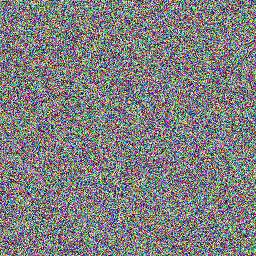

 30%|██▉       | 298/1000 [00:06<00:16, 43.86it/s]

'Image at step 300'

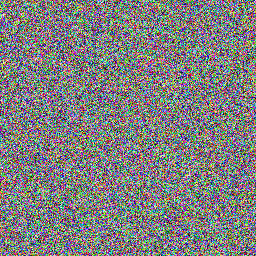

 35%|███▍      | 348/1000 [00:08<00:14, 43.83it/s]

'Image at step 350'

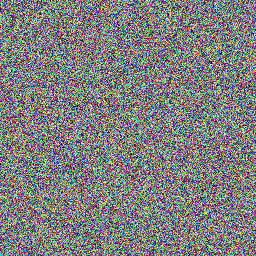

 40%|███▉      | 398/1000 [00:09<00:13, 43.73it/s]

'Image at step 400'

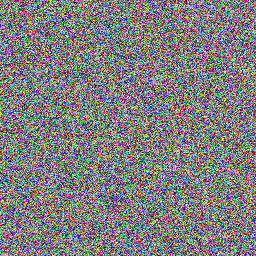

 45%|████▍     | 448/1000 [00:10<00:12, 43.66it/s]

'Image at step 450'

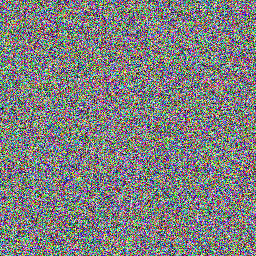

 50%|████▉     | 498/1000 [00:11<00:11, 43.68it/s]

'Image at step 500'

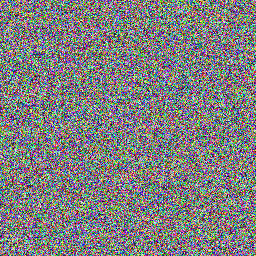

 55%|█████▍    | 548/1000 [00:12<00:10, 43.77it/s]

'Image at step 550'

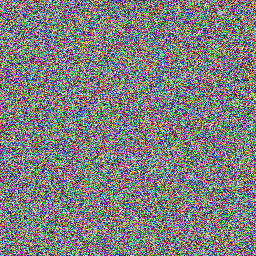

 60%|█████▉    | 598/1000 [00:13<00:09, 43.79it/s]

'Image at step 600'

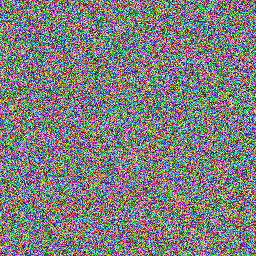

 65%|██████▍   | 648/1000 [00:14<00:08, 43.54it/s]

'Image at step 650'

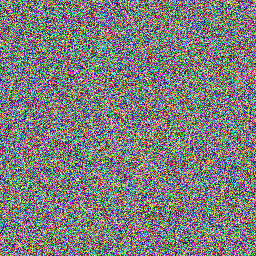

 70%|██████▉   | 698/1000 [00:16<00:06, 43.68it/s]

'Image at step 700'

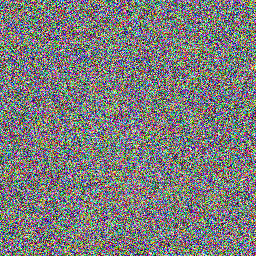

 75%|███████▍  | 748/1000 [00:17<00:05, 43.80it/s]

'Image at step 750'

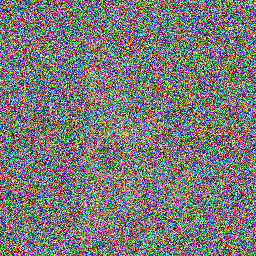

 80%|███████▉  | 798/1000 [00:18<00:04, 43.67it/s]

'Image at step 800'

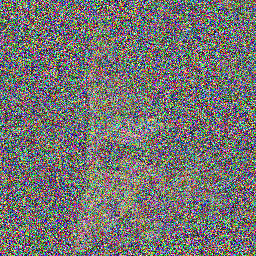

 85%|████████▍ | 848/1000 [00:19<00:03, 43.64it/s]

'Image at step 850'

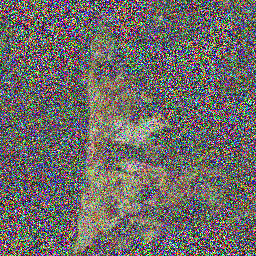

 90%|████████▉ | 898/1000 [00:20<00:02, 43.81it/s]

'Image at step 900'

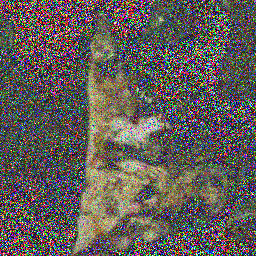

 95%|█████████▍| 948/1000 [00:21<00:01, 43.60it/s]

'Image at step 950'

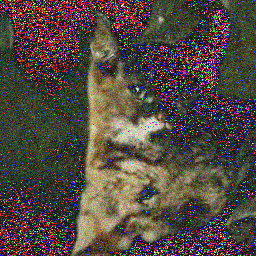

100%|█████████▉| 998/1000 [00:23<00:00, 43.77it/s]

'Image at step 1000'

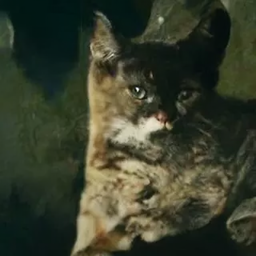

100%|██████████| 1000/1000 [00:23<00:00, 43.29it/s]


In [21]:
import tqdm

sample = noisy_sample

for i, t in enumerate(tqdm.tqdm(scheduler.timesteps)):
    # 1. predict noise residual
    with torch.no_grad():
        residual = model(sample, t).sample

    # 2. compute less noisy image and set x_t -> x_t-1
    sample = scheduler.step(residual, t, sample).prev_sample

    # 3. optionally look at image
    if (i + 1) % 50 == 0:
        display_sample(sample, i + 1)

  4%|▍         | 45/1000 [00:01<00:21, 43.75it/s]

'Image at step 50'

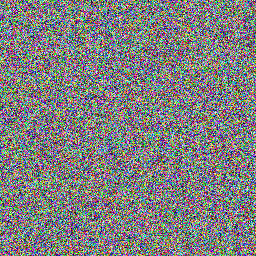

 10%|▉         | 96/1000 [00:02<00:20, 43.66it/s]

'Image at step 100'

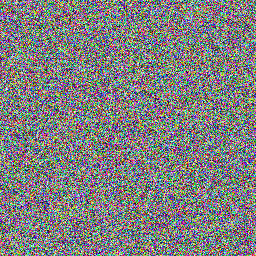

 15%|█▍        | 146/1000 [00:03<00:19, 43.70it/s]

'Image at step 150'

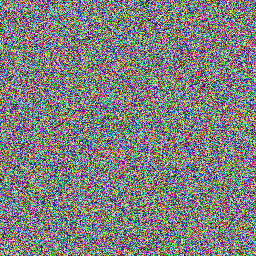

 20%|█▉        | 196/1000 [00:04<00:18, 43.59it/s]

'Image at step 200'

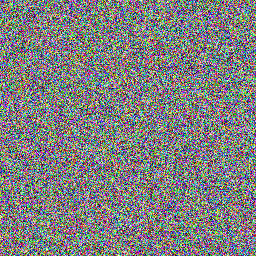

 25%|██▍       | 246/1000 [00:05<00:17, 43.73it/s]

'Image at step 250'

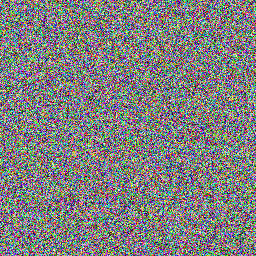

 30%|██▉       | 296/1000 [00:06<00:16, 43.67it/s]

'Image at step 300'

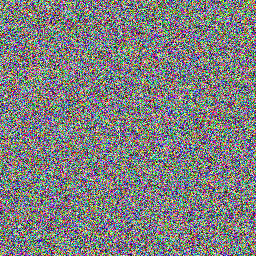

 35%|███▍      | 346/1000 [00:07<00:14, 43.70it/s]

'Image at step 350'

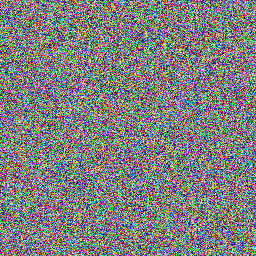

 40%|███▉      | 396/1000 [00:09<00:13, 43.69it/s]

'Image at step 400'

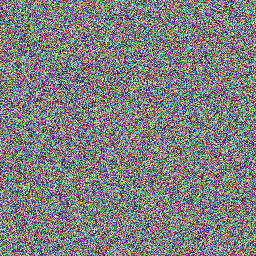

 45%|████▍     | 446/1000 [00:10<00:12, 43.59it/s]

'Image at step 450'

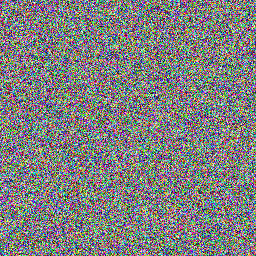

 50%|████▉     | 496/1000 [00:11<00:11, 43.75it/s]

'Image at step 500'

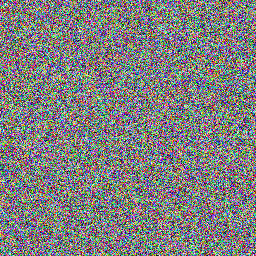

 55%|█████▍    | 546/1000 [00:12<00:10, 43.59it/s]

'Image at step 550'

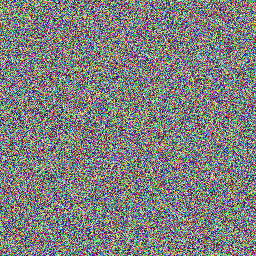

 60%|█████▉    | 596/1000 [00:13<00:09, 43.59it/s]

'Image at step 600'

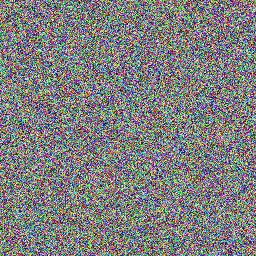

 65%|██████▍   | 646/1000 [00:14<00:08, 43.39it/s]

'Image at step 650'

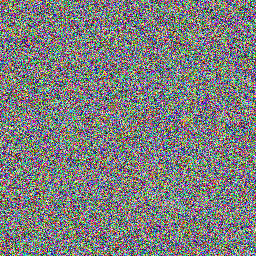

 70%|██████▉   | 696/1000 [00:16<00:06, 43.57it/s]

'Image at step 700'

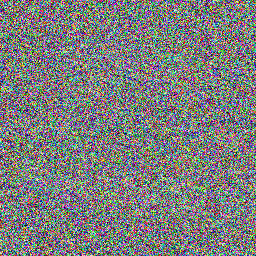

 75%|███████▍  | 746/1000 [00:17<00:05, 43.49it/s]

'Image at step 750'

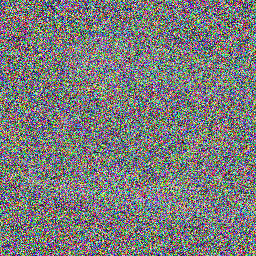

 80%|███████▉  | 796/1000 [00:18<00:04, 43.47it/s]

'Image at step 800'

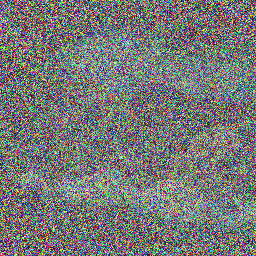

 85%|████████▍ | 846/1000 [00:19<00:03, 43.53it/s]

'Image at step 850'

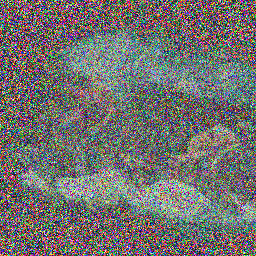

 90%|████████▉ | 896/1000 [00:20<00:02, 43.48it/s]

'Image at step 900'

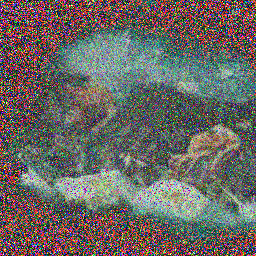

 95%|█████████▍| 946/1000 [00:21<00:01, 43.60it/s]

'Image at step 950'

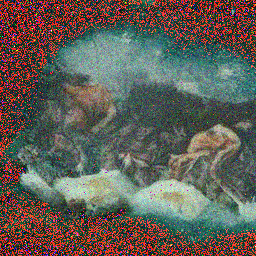

100%|█████████▉| 996/1000 [00:23<00:00, 43.61it/s]

'Image at step 1000'

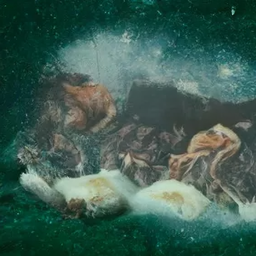

100%|██████████| 1000/1000 [00:23<00:00, 43.25it/s]


In [22]:
import tqdm

sample = noisy_sample

for i, t in enumerate(tqdm.tqdm(scheduler.timesteps)):
    # 1. predict noise residual
    with torch.no_grad():
        residual = model(sample, t).sample

    # 2. compute less noisy image and set x_t -> x_t-1
    sample = scheduler.step(residual, t, sample).prev_sample

    # 3. optionally look at image
    if (i + 1) % 50 == 0:
        display_sample(sample, i + 1)